In [1]:
# Cameron Schultz 
# ckschult@usc.edu
# Github: ckschultz


#(Intending to use a two late days, please.)

In [37]:
import sklearn
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
import seaborn as sb
import matplotlib.pyplot as plt
import math
from matplotlib.pyplot import figure
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, mean_squared_error, roc_curve, roc_auc_score, auc
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold
# import sys
# !{sys.executable} -m pip install imblearn
# import imblearn
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from imblearn.pipeline import Pipeline as imbpipeline



# Setup: Reading data, building dfs 

In [2]:
fp1 = '../data/aps_failure_training_set.csv'
fp2 = '../data/aps_failure_test_set.csv'

df1 = pd.read_csv(fp1, skiprows=20)
df2 = pd.read_csv(fp2, skiprows=20)

df = pd.concat([df1, df2], axis=0)
df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,na,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,neg,79636,na,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,neg,110,na,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


# B i) Imputation 

Using simple imputation, mean value (not the ideal method, but faster to run)

In [3]:
df = df.replace(['na', 'NAN'], np.nan)
df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,NaN,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,NaN,0,NaN,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,NaN,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,NaN,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,NaN,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,neg,79636,NaN,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,neg,110,NaN,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


In [4]:
# CONVERTING POSITIVE/NEG TO BINARY VARIABLES 
rawclass = df['class']
df = df.replace('neg', 0) 
df = df.replace('pos', 1)
df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,76698,NaN,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,0,33058,NaN,0,NaN,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,0,41040,NaN,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,0,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,0,60874,NaN,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,0,81852,NaN,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,0,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,0,79636,NaN,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,0,110,NaN,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


In [5]:
headers = df.columns.values
# print(headers)

imp = SimpleImputer(missing_values=np.nan, strategy='median') # using mode 
imp = imp.fit(df)
impdf = imp.transform(df)
impdf = pd.DataFrame(impdf, columns=headers)

impdf

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0.0,76698.0,0.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,0.0,33058.0,0.0,0.000000e+00,128.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,0.0,41040.0,0.0,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,0.0,12.0,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,0.0,60874.0,0.0,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,0.0,81852.0,0.0,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
75996,0.0,18.0,0.0,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
75997,0.0,79636.0,0.0,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
75998,0.0,110.0,0.0,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


In [6]:
# SPLIT BACK INTO TRAIN/TEST DATA 

traindf = df.iloc[:60000, :]
testdf = df.iloc[60000:, :]


## B ii) Coefficient of Variation 

In [8]:
cofv = lambda x: np.std(x, ddof=1)/np.mean(x) # ddof for sample std
cvs = impdf.apply(cofv)
cvs = list(cvs) # list of coefficients of variation
# print("Coefficients of variation:\n\n", cvs)

impcvs = []
for i in range(len(cvs)):
    impcvs.append([headers[i], cvs[i]])

print(impcvs)

[['class', 7.367051065173237], ['aa_000', 4.328607835435785], ['ab_000', 9.740521413403464], ['ac_000', 2.309299210767588], ['ad_000', 274.79037832074823], ['ae_000', 23.271356875770618], ['af_000', 19.00795349690373], ['ag_000', 92.50751026902506], ['ag_001', 42.56614498697309], ['ag_002', 17.827963415925428], ['ag_003', 8.854130035468994], ['ag_004', 5.5382764492287375], ['ag_005', 2.9941084228491115], ['ag_006', 2.364742477824575], ['ag_007', 2.8381432887190106], ['ag_008', 6.343995298114335], ['ag_009', 32.53539492233057], ['ah_000', 2.327355260706818], ['ai_000', 18.70147581406984], ['aj_000', 43.59894598655002], ['ak_000', 84.87514625018275], ['al_000', 9.210860085158966], ['am_0', 9.16325487324829], ['an_000', 2.265607931728473], ['ao_000', 2.286911235995885], ['ap_000', 3.1081178340159776], ['aq_000', 2.871100856097189], ['ar_000', 11.079623721004758], ['as_000', 115.0820770421762], ['at_000', 23.431462812479467], ['au_000', 86.99224820581605], ['av_000', 5.9579360050479595], [

# B iii) Correlation Matrix (and Heatmap)

In [9]:
impdf
# temp = df.iloc[:,:].astype(float) 
# temp
corr_matrix = impdf.corr()
print(corr_matrix)

           class    aa_000    ab_000    ac_000    ad_000    ae_000    af_000  \
class   1.000000  0.323466  0.019554 -0.054178 -0.000490  0.002886  0.010961   
aa_000  0.323466  1.000000  0.009953 -0.037851 -0.000801  0.023778  0.033524   
ab_000  0.019554  0.009953  1.000000 -0.002489 -0.000372  0.034129  0.053156   
ac_000 -0.054178 -0.037851 -0.002489  1.000000 -0.001568 -0.004005 -0.009773   
ad_000 -0.000490 -0.000801 -0.000372 -0.001568  1.000000 -0.000156 -0.000190   
...          ...       ...       ...       ...       ...       ...       ...   
ee_007  0.176693  0.356954  0.010747 -0.048884 -0.000722  0.034168  0.043477   
ee_008  0.239035  0.259626 -0.026319 -0.004806 -0.001060 -0.009518 -0.012225   
ee_009  0.118784  0.133790 -0.017057  0.012019 -0.000622 -0.007330 -0.009004   
ef_000  0.011032  0.005648  0.051733 -0.006200 -0.000072  0.063622  0.093517   
eg_000  0.009306  0.009239  0.077262  0.016273 -0.000076  0.030893  0.044417   

          ag_000    ag_001    ag_002  .

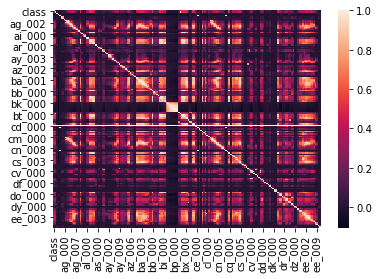

In [10]:
sb.heatmap(corr_matrix)
plt.show()

# B iv) Highest CV Features 

In [11]:
a = math.floor(170**(1/2)) # 170 total features in this dataset 
print("We need to select the top", a, "features with the highest coefficient of variation.")

We need to select the top 13 features with the highest coefficient of variation.


In [12]:
# FINDING MAX CV'S 

impcvs.sort(key=lambda x: x[1], reverse=True)
# impcvs

keep = impcvs[:13]
# keep.append(['class', 7.367051065173237])
keep



[['cf_000', 275.59581954240133],
 ['co_000', 275.06813766470566],
 ['ad_000', 274.79037832074823],
 ['cs_009', 194.7209367254757],
 ['dj_000', 130.91523284217536],
 ['dh_000', 120.75950443978842],
 ['df_000', 119.38441081890309],
 ['as_000', 115.0820770421762],
 ['ag_000', 92.50751026902506],
 ['au_000', 86.99224820581605],
 ['ak_000', 84.87514625018275],
 ['az_009', 78.8955076015501],
 ['ay_009', 78.35086849671488]]

In [32]:
keys = []
for key in keep:
    keys.append(key[0])
rawclass = np.array(rawclass).reshape(-1, 1)
# print(rawclass)
temp = impdf[keys]
temp
temp['class'] = rawclass
temp


<ipython-input-32-fae760306775>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['class'] = rawclass


,cf_000,co_000,ad_000,cs_009,dj_000,dh_000,df_000,as_000,ag_000,au_000,ak_000,az_009,ay_009,class
0,2.0,220.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
1,2.0,8.0,128.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
2,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
3,2.0,2.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
4,0.0,202.0,458.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,2.0,42.0,892.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
75996,2.0,0.0,46.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
75997,2.0,378.0,1518.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
75998,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg


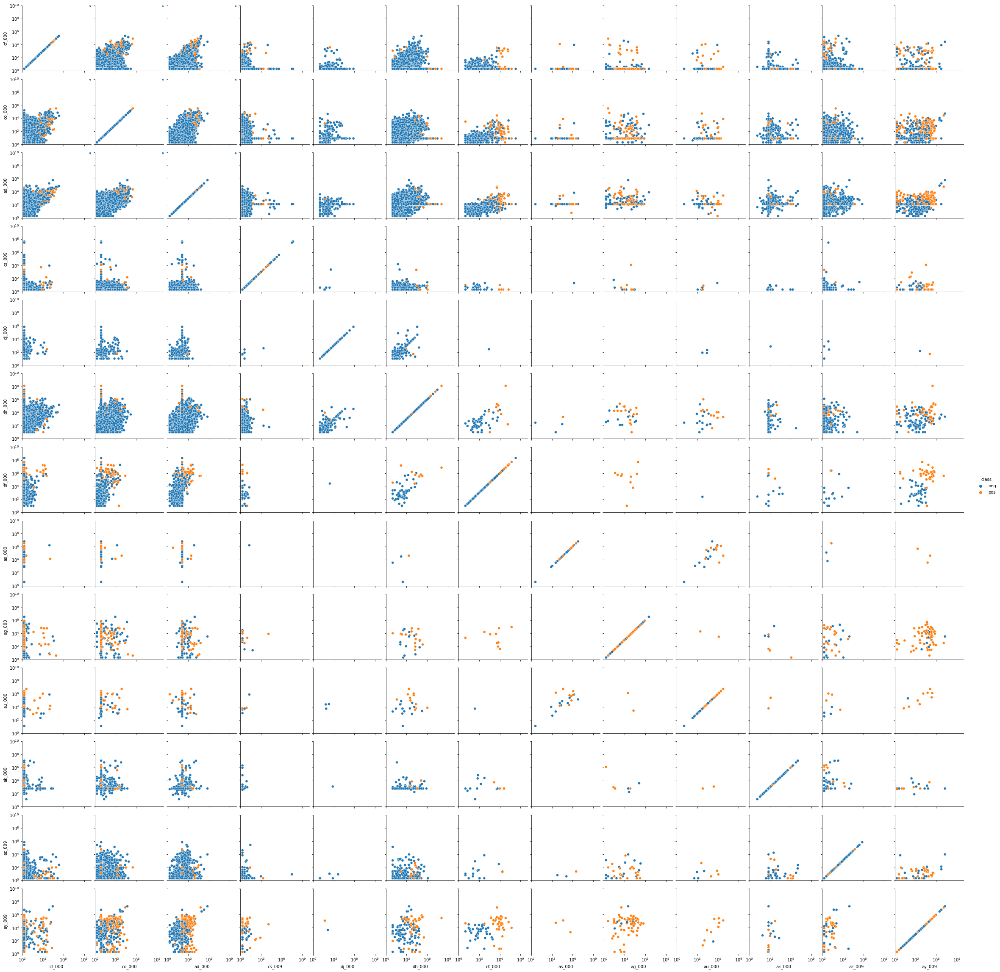

In [39]:
crossplot = sb.pairplot(temp, hue='class', diag_kind=None)
crossplot.set(xscale='log', yscale='log')
for ax in crossplot.axes.flat:
        ax.set_xlim(1, 10**10)
        ax.set_ylim(1, 10**10)

plt.show(crossplot)


# Boxplots

### Log Scaled y-axis

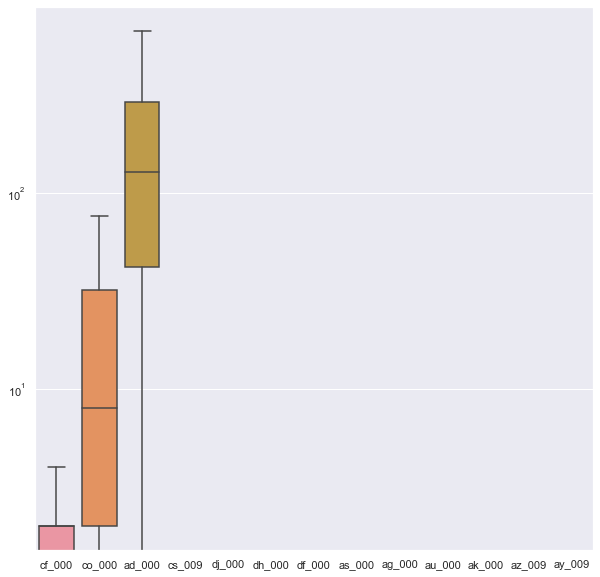

In [59]:

tempplt = temp.drop('class', axis=1)
sb.set(rc={"figure.figsize":(10, 10)}) #width=6, height=5

fig = sb.boxplot(data=tempplt, showfliers = False)
fig.set_yscale("log")

plt.show()

### Default y-axis Scaling

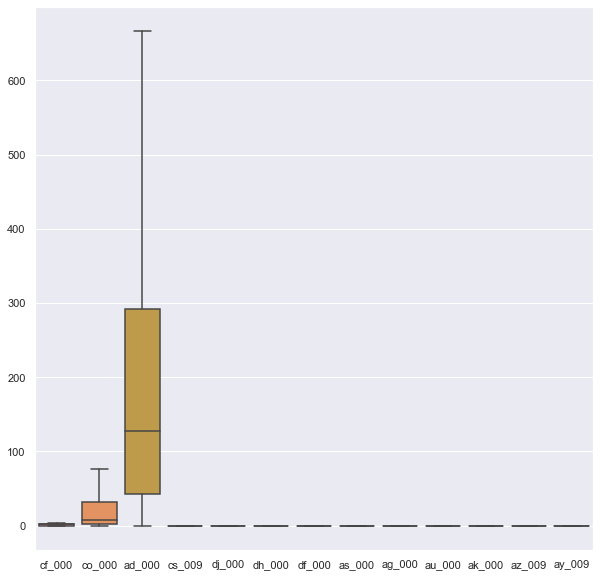

In [60]:
sb.set(rc={"figure.figsize":(10, 10)}) #width=6, height=5
fig = sb.boxplot(data=tempplt, showfliers = False)
plt.show()

### Conclusions 


From these plots, although we can see how certain features have a strong covariance, we cannot make any serious conclusions about their significance of these features. We can see that certain variables may have a strong relationship with each other, but not necessarily whether they have a strong significance in the overall model.  

# B v) Positive and Negative Classes

In [61]:
temp['class'].value_counts()

neg    74625
pos     1375
Name: class, dtype: int64

Yes, this data set is imbalanced. About 1.85% of the data set consists of positive cases, while over 98% of the cases are negative. These two classes, positive and negative, are not at all equal in size. 

# C) Random Forest

In [15]:
# SPLIT BACK INTO TRAIN/TEST DATA 
trainx = impdf.iloc[:60000, :].drop('class', axis=1)
trainy = impdf.iloc[:60000, :]['class']
testx = impdf.iloc[60000:, :].drop('class', axis=1)
testy = impdf.iloc[60000:, :]['class']


In [100]:
rfc = RandomForestClassifier(random_state=42, oob_score = True).fit(trainx, trainy)

In [101]:
rfpredicttrain = rfc.predict(trainx)
rfpredicttest = rfc.predict(testx)

## Training Set:
### Confusion Matrix

In [109]:
confusion_matrix = sklearn.metrics.confusion_matrix(trainy, rfpredicttrain)
print("Confusion Matrix:")
print(confusion_matrix)
true_pos = confusion_matrix[1, 1]
true_neg = confusion_matrix[0, 0]
false_neg = confusion_matrix[1, 0]
false_pos = confusion_matrix[0, 1]

print("True Negative:", true_neg)
print("False Positive:", false_pos)
print("False Negative:", false_neg)
print("True Positive:", true_pos)

Confusion Matrix:
[[59000     0]
 [    1   999]]
True Negative: 59000
False Positive: 0
False Negative: 1
True Positive: 999


## Training Error + Misclassification Rate

In [110]:
# TRAIN ERROR 
mse = mean_squared_error(trainy, rfpredicttrain)
print("Training Error (MSE):", mse)


# MISCLASSIFICATION RATE 
mis = (false_pos+false_neg)/(true_pos+true_neg+false_pos+false_neg)
print("Misclassification Rate: " + str(mis) + ", or about "+ str(mis*100) + '%.' )

Training Error (MSE): 1.6666666666666667e-05
Misclassification Rate: 1.6666666666666667e-05, or about 0.0016666666666666668%.


## ROC, AUC

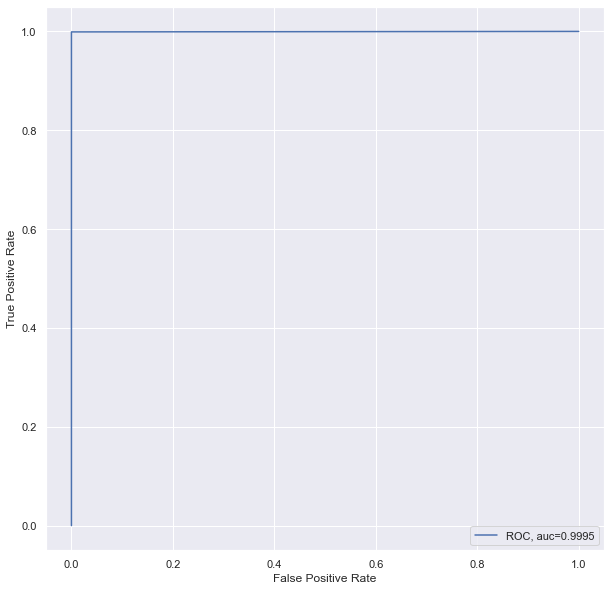

In [117]:
fpr, tpr, _ = roc_curve(trainy,  rfpredicttrain)
auc = roc_auc_score(trainy, rfpredicttrain)
plt.plot(fpr, tpr,label="ROC, auc="+str(auc))
# print(fpr, tpr)
plt.legend(loc=4)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


## Test Set:
### Confusion Matrix

In [111]:
confusion_matrix = sklearn.metrics.confusion_matrix(testy, rfpredicttest)
print("Confusion Matrix:")
print(confusion_matrix)
true_pos = confusion_matrix[1, 1]
true_neg = confusion_matrix[0, 0]
false_neg = confusion_matrix[1, 0]
false_pos = confusion_matrix[0, 1]

print("True Negative:", true_neg)
print("False Positive:", false_pos)
print("False Negative:", false_neg)
print("True Positive:", true_pos)

Confusion Matrix:
[[15611    14]
 [  107   268]]
True Negative: 15611
False Positive: 14
False Negative: 107
True Positive: 268


## Test Error + Misclassification Rate

In [112]:
# TEST ERROR 
mse = mean_squared_error(testy, rfpredicttest)
print("Test Error (MSE):", mse)


# MISCLASSIFICATION RATE 
mis = (false_pos+false_neg)/(true_pos+true_neg+false_pos+false_neg)
print("Misclassification Rate: " + str(mis) + ", or about "+ str(mis*100) + '%.' )

Test Error (MSE): 0.0075625
Misclassification Rate: 0.0075625, or about 0.75625%.


## ROC, AUC

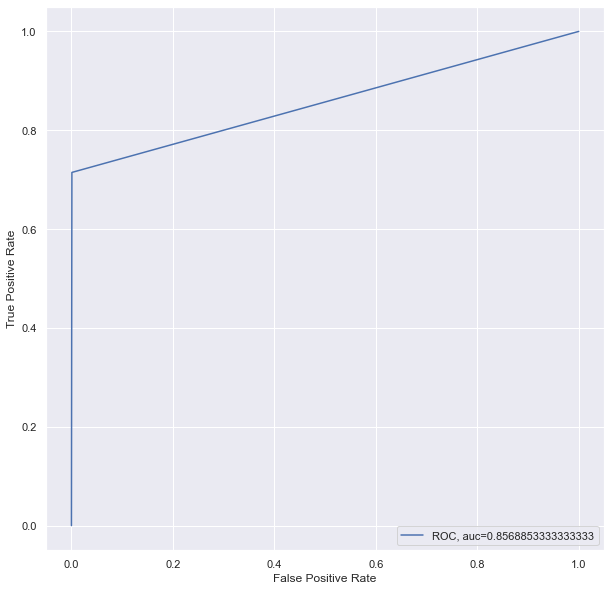

In [113]:
fpr, tpr, _ = roc_curve(testy,  rfpredicttest)
auc = roc_auc_score(testy, rfpredicttest)
plt.plot(fpr, tpr,label="ROC, auc="+str(auc))
# print(fpr, tpr)
plt.legend(loc=4)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


## Out-Of-Bag Error, Comparisons to Test Error

In [118]:
print("Random Forest Classifier Out-Of-Bag Error:", 1-rfc.oob_score_)
print("Test Error:", mse)

Random Forest Classifier Out-Of-Bag Error: 0.006133333333333324
Test Error: 0.0075625


As we can see, the Out-Of-Bag error (1-OOB score) for the test data is very small, which matches with the test error (MSE) which is also very low. However, Out-Of-Bag error is just slightly lower than the test error

# D) Compensating for Class Imbalances in Random Forests

In [119]:
rfc_bal = RandomForestClassifier(random_state=42, oob_score = True, class_weight='balanced').fit(trainx, trainy)

In [127]:
rfpredicttrain_bal = rfc_bal.predict(trainx)
rfpredicttest_bal = rfc_bal.predict(testx)

## Training Set:
### Confusion Matrix

In [128]:
confusion_matrix = sklearn.metrics.confusion_matrix(trainy, rfpredicttrain_bal)
print("Confusion Matrix:")
print(confusion_matrix)
true_pos = confusion_matrix[1, 1]
true_neg = confusion_matrix[0, 0]
false_neg = confusion_matrix[1, 0]
false_pos = confusion_matrix[0, 1]

print("True Negative:", true_neg)
print("False Positive:", false_pos)
print("False Negative:", false_neg)
print("True Positive:", true_pos)

Confusion Matrix:
[[59000     0]
 [    1   999]]
True Negative: 59000
False Positive: 0
False Negative: 1
True Positive: 999


## Training Error + Misclassification Rate

In [129]:
# TRAIN ERROR 
mse = mean_squared_error(trainy, rfpredicttrain_bal)
print("Training Error (MSE):", mse)


# MISCLASSIFICATION RATE 
mis = (false_pos+false_neg)/(true_pos+true_neg+false_pos+false_neg)
print("Misclassification Rate: " + str(mis) + ", or about "+ str(mis*100) + '%.' )

Training Error (MSE): 1.6666666666666667e-05
Misclassification Rate: 1.6666666666666667e-05, or about 0.0016666666666666668%.


## ROC, AUC

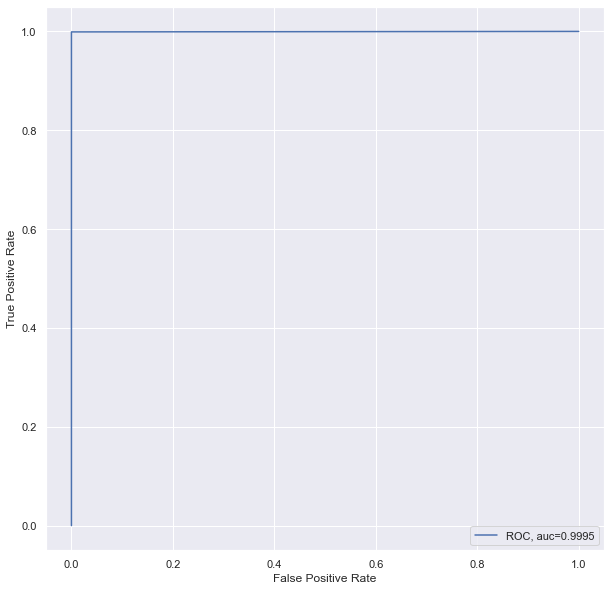

In [130]:
fpr, tpr, _ = roc_curve(trainy,  rfpredicttrain_bal)
auc = roc_auc_score(trainy, rfpredicttrain_bal)
plt.plot(fpr, tpr,label="ROC, auc="+str(auc))
# print(fpr, tpr)
plt.legend(loc=4)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


## Test Set:
### Confusion Matrix

In [131]:
confusion_matrix = sklearn.metrics.confusion_matrix(testy, rfpredicttest_bal)
print("Confusion Matrix:")
print(confusion_matrix)
true_pos = confusion_matrix[1, 1]
true_neg = confusion_matrix[0, 0]
false_neg = confusion_matrix[1, 0]
false_pos = confusion_matrix[0, 1]

print("True Negative:", true_neg)
print("False Positive:", false_pos)
print("False Negative:", false_neg)
print("True Positive:", true_pos)

Confusion Matrix:
[[15612    13]
 [  158   217]]
True Negative: 15612
False Positive: 13
False Negative: 158
True Positive: 217


## Test Error + Misclassification Rate

In [132]:
# TEST ERROR 
mse = mean_squared_error(testy, rfpredicttest_bal)
print("Test Error (MSE):", mse)


# MISCLASSIFICATION RATE 
mis = (false_pos+false_neg)/(true_pos+true_neg+false_pos+false_neg)
print("Misclassification Rate: " + str(mis) + ", or about "+ str(mis*100) + '%.' )

Test Error (MSE): 0.0106875
Misclassification Rate: 0.0106875, or about 1.06875%.


## ROC, AUC

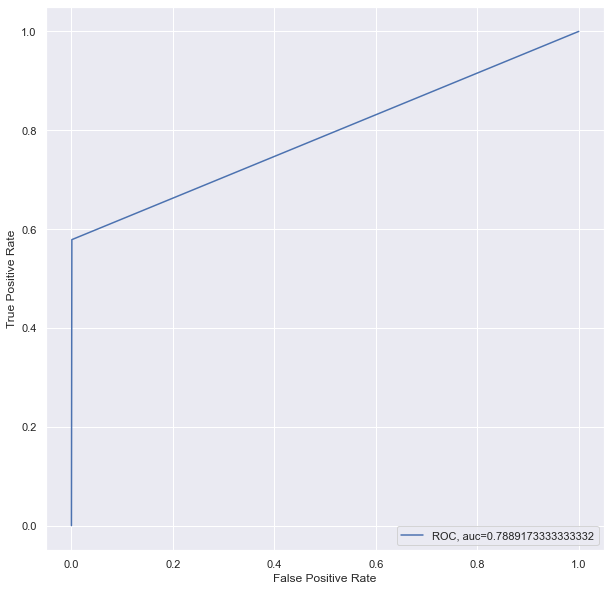

In [133]:
fpr, tpr, _ = roc_curve(testy,  rfpredicttest_bal)
auc = roc_auc_score(testy, rfpredicttest_bal)
plt.plot(fpr, tpr,label="ROC, auc="+str(auc))
# print(fpr, tpr)
plt.legend(loc=4)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


In [135]:
print("Random Forest Classifier Out-Of-Bag Error:", 1-rfc_bal.oob_score_)
print("Test Error:", mse)

Random Forest Classifier Out-Of-Bag Error: 0.007966666666666677
Test Error: 0.0106875


With the balanced dataset, the Out-Of-Bag error (1-OOB score) for the test data is still small, and the test error (MSE) which is also very low. Out-Of-Bag error is still lower than test error for the balanced data set. However, both the Out-Of-Bag error and the test error for the balanced dataset are slightly larger than their respective scores for the unbalanced dataset. 

# E) XGB Boost and Model Trees

In [8]:
# pick range of alphas to cross validate (determines L1 penalty)
xgbalphas = []
for i in range(-4, 5):
    xgbalphas.append(10**i)
# print(ridgelambdas)
print(xgbalphas)

[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]


In [167]:
grid_vals = {'reg_alpha': xgbalphas, 'random_state':[42]}
xgb_classifier = xgb.XGBClassifier(objective ='reg:logistic')
gs = GridSearchCV(xgb_classifier, param_grid=grid_vals, cv=5, scoring='neg_mean_squared_error')
gs.fit(trainx, trainy)

mse = gs.cv_results_['mean_test_score'] 
alpha = gs.cv_results_['param_reg_alpha'] 


In [168]:
print("Best parameter (CV score=%0.3f):" % gs.best_score_)
print(gs.best_params_)

Best parameter (CV score=-0.005):
{'random_state': 42, 'reg_alpha': 0.01}


In [169]:
xgbr = xgb.XGBClassifier(objective ='reg:logistic', reg_alpha=gs.best_params_['reg_alpha'])
xgbr.fit(trainx, trainy)
pred = xgbr.predict(testx)
pred_train = xgbr.predict(trainx)
mse_train = mean_squared_error(trainy, pred_train)
mse = mean_squared_error(testy, pred)
print("Train MSE (L1 Penalized Gradient Boosting Tree, Best Alpha =", gs.best_params_['reg_alpha'], "):", mse_train)
print("Test MSE (L1 Penalized Gradient Boosting Tree, Best Alpha =", gs.best_params_['reg_alpha'], "):", mse)

Train MSE (L1 Penalized Gradient Boosting Tree, Best Alpha = 0.01 ): 1.6666666666666667e-05
Test MSE (L1 Penalized Gradient Boosting Tree, Best Alpha = 0.01 ): 0.0061875


## Train Data

### Confusion Matrix

In [170]:
confusion_matrix = sklearn.metrics.confusion_matrix(trainy, pred_train)
print("Confusion Matrix:")
print(confusion_matrix)
true_pos = confusion_matrix[1, 1]
true_neg = confusion_matrix[0, 0]
false_neg = confusion_matrix[1, 0]
false_pos = confusion_matrix[0, 1]

print("True Negative:", true_neg)
print("False Positive:", false_pos)
print("False Negative:", false_neg)
print("True Positive:", true_pos)

Confusion Matrix:
[[59000     0]
 [    1   999]]
True Negative: 59000
False Positive: 0
False Negative: 1
True Positive: 999


### ROC, AUC

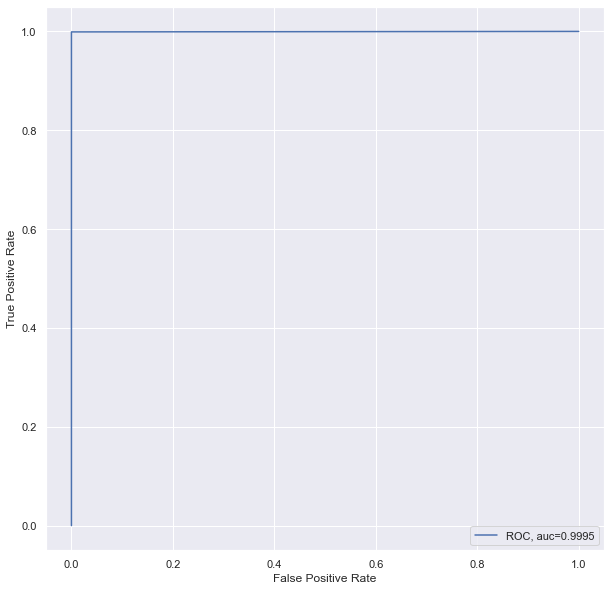

In [171]:
fpr, tpr, _ = roc_curve(trainy,  pred_train)
auc = roc_auc_score(trainy, pred_train)
plt.plot(fpr, tpr,label="ROC, auc="+str(auc))
# print(fpr, tpr)
plt.legend(loc=4)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


## Test Data

### Confusion Matrix

In [172]:
confusion_matrix = sklearn.metrics.confusion_matrix(testy, pred)
print("Confusion Matrix:")
print(confusion_matrix)
true_pos = confusion_matrix[1, 1]
true_neg = confusion_matrix[0, 0]
false_neg = confusion_matrix[1, 0]
false_pos = confusion_matrix[0, 1]

print("True Negative:", true_neg)
print("False Positive:", false_pos)
print("False Negative:", false_neg)
print("True Positive:", true_pos)

Confusion Matrix:
[[15608    17]
 [   82   293]]
True Negative: 15608
False Positive: 17
False Negative: 82
True Positive: 293


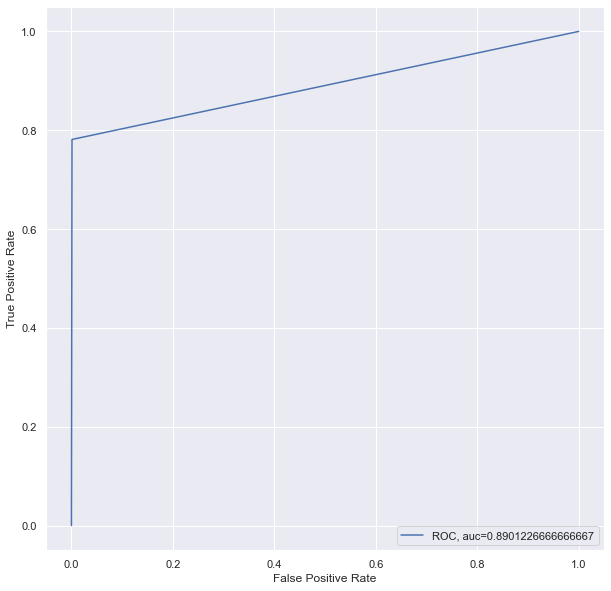

In [173]:
fpr, tpr, _ = roc_curve(testy,  pred)
auc = roc_auc_score(testy, pred)
plt.plot(fpr, tpr,label="ROC, auc="+str(auc))
# print(fpr, tpr)
plt.legend(loc=4)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


# F) SMOTE Preprocessing

In [32]:
xgb_classifier = xgb.XGBClassifier(objective ='reg:logistic', random_state=42)

pipeline = imbpipeline(steps = [['smote', SMOTE(random_state=42)],
                                ['classifier', xgb_classifier]])

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

grid_vals = {'classifier__reg_alpha': xgbalphas}

grid_search = GridSearchCV(estimator=pipeline, param_grid=grid_vals, scoring='roc_auc', cv=stratified_kfold) # changed
# to roc_auc error instead of mse 

grid_search.fit(trainx, trainy)
train_pred = grid_search.predict(trainx)
test_pred = grid_search.predict(testx)


mse_train = mean_squared_error(trainy, train_pred)
mse = mean_squared_error(testy, test_pred)

cv_score = grid_search.best_score_
# test_score = grid_search.score(testx, testy)
print(f'Cross-validation score: {cv_score}\nTrain Score: {mse_train}\nTest Score: {mse}')



Cross-validation score: 0.9867981779661017
Train Score: 1.6666666666666667e-05
Test Score: 0.007


The above scores are MSE, which is not necessarily applicable to classification problems. Instead, we use AUC score, as shown below:

## Model Score (AUC)

In [42]:
train_auc = sklearn.metrics.roc_auc_score(trainy, train_pred)
test_auc = sklearn.metrics.roc_auc_score(testy, test_pred)
print("Train Score:", train_auc)
print("Test Score:", test_auc)

Train Score: 0.9995
Test Score: 0.9144319999999999


## Training Data

### Confusion Matrix

In [33]:
confusion_matrix = sklearn.metrics.confusion_matrix(trainy, train_pred)
print("Confusion Matrix:")
print(confusion_matrix)
true_pos = confusion_matrix[1, 1]
true_neg = confusion_matrix[0, 0]
false_neg = confusion_matrix[1, 0]
false_pos = confusion_matrix[0, 1]

print("True Negative:", true_neg)
print("False Positive:", false_pos)
print("False Negative:", false_neg)
print("True Positive:", true_pos)

Confusion Matrix:
[[59000     0]
 [    1   999]]
True Negative: 59000
False Positive: 0
False Negative: 1
True Positive: 999


## ROC, AUC

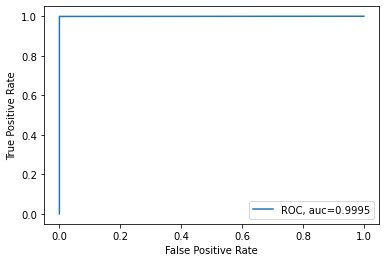

In [34]:
fpr, tpr, _ = roc_curve(trainy,  train_pred)
auc = roc_auc_score(trainy, train_pred)
plt.plot(fpr, tpr,label="ROC, auc="+str(auc))
# print(fpr, tpr)
plt.legend(loc=4)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


## Test Data
### Confusion Matrix

In [35]:
confusion_matrix = sklearn.metrics.confusion_matrix(testy, test_pred)
print("Confusion Matrix:")
print(confusion_matrix)
true_pos = confusion_matrix[1, 1]
true_neg = confusion_matrix[0, 0]
false_neg = confusion_matrix[1, 0]
false_pos = confusion_matrix[0, 1]

print("True Negative:", true_neg)
print("False Positive:", false_pos)
print("False Negative:", false_neg)
print("True Positive:", true_pos)

Confusion Matrix:
[[15576    49]
 [   63   312]]
True Negative: 15576
False Positive: 49
False Negative: 63
True Positive: 312


### ROC, AUC

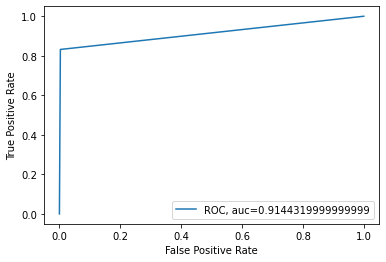

In [36]:
fpr, tpr, _ = roc_curve(testy,  test_pred)
auc = roc_auc_score(testy, test_pred)
plt.plot(fpr, tpr,label="ROC, auc="+str(auc))
# print(fpr, tpr)
plt.legend(loc=4)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


### Compare to Uncompensated Case

The AUC score is greater after SMOTE, which suggests a better fitting model. 

# ISLR Questions
## 6.6.3

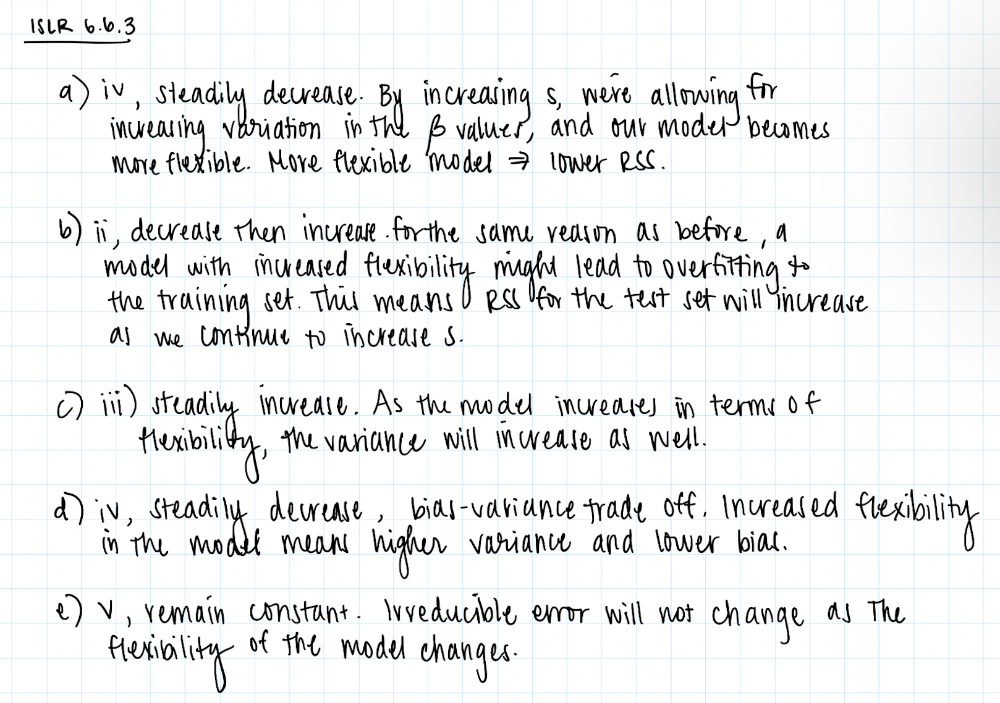

## 6.6.5

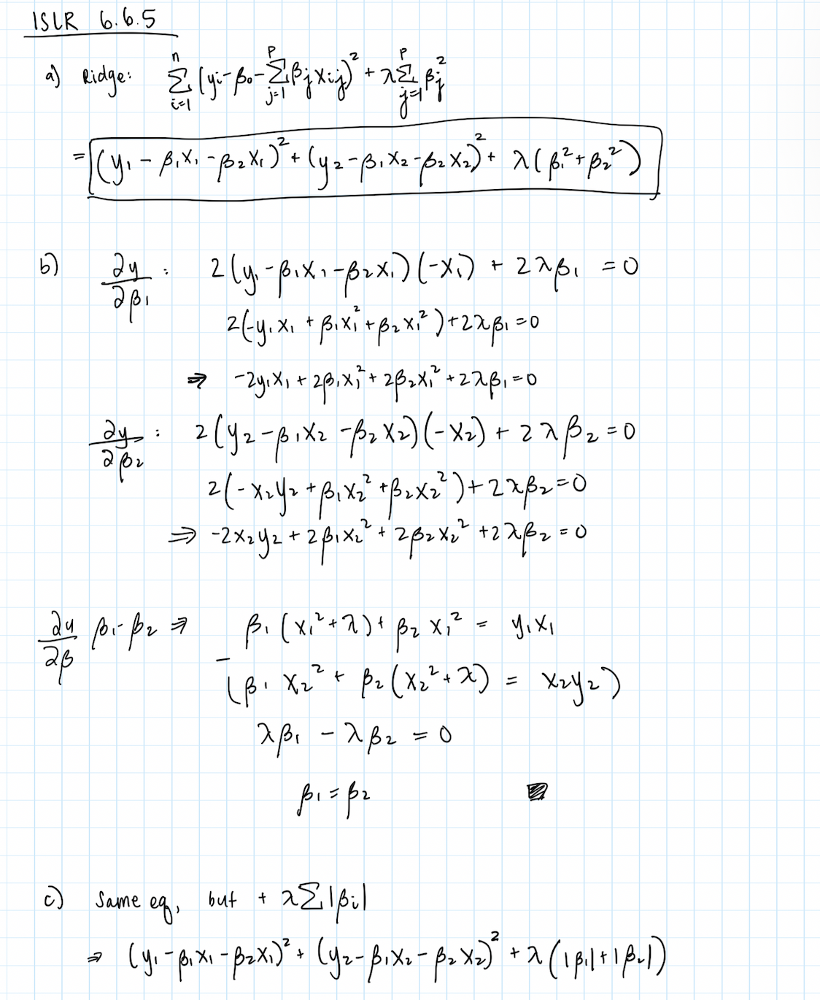


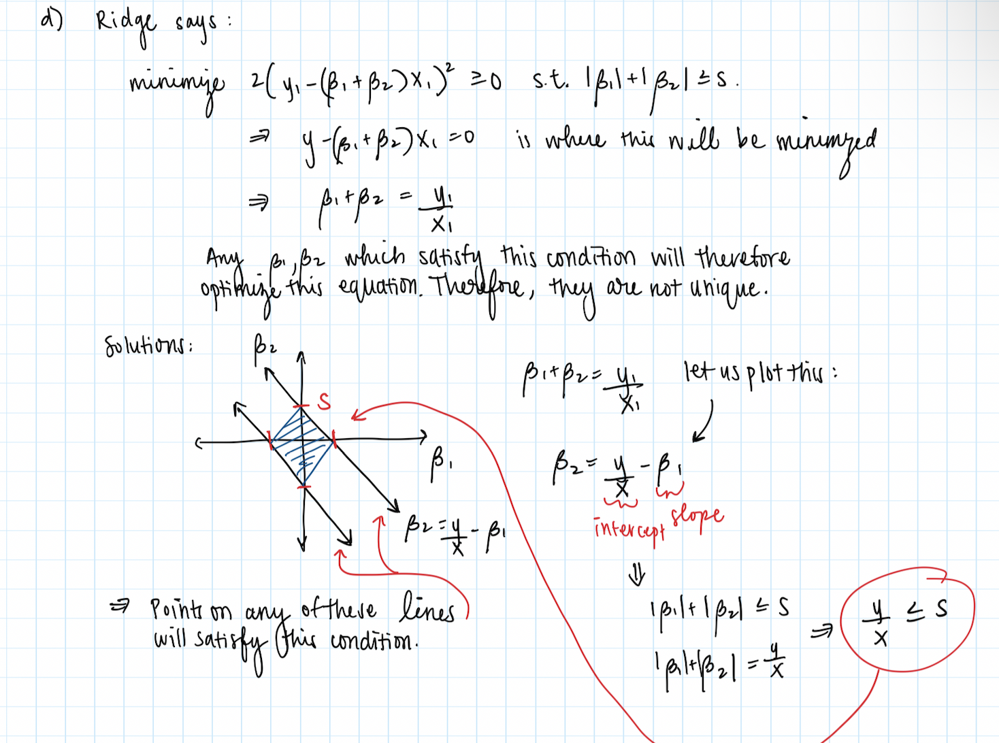

### 8.4.5 
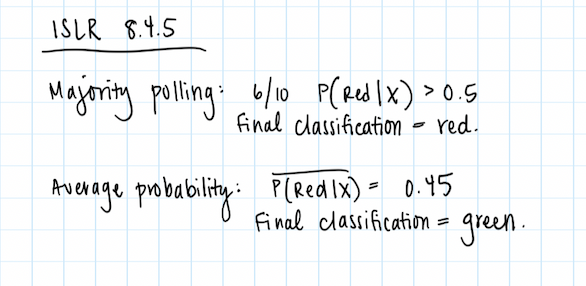


## 9.7.3
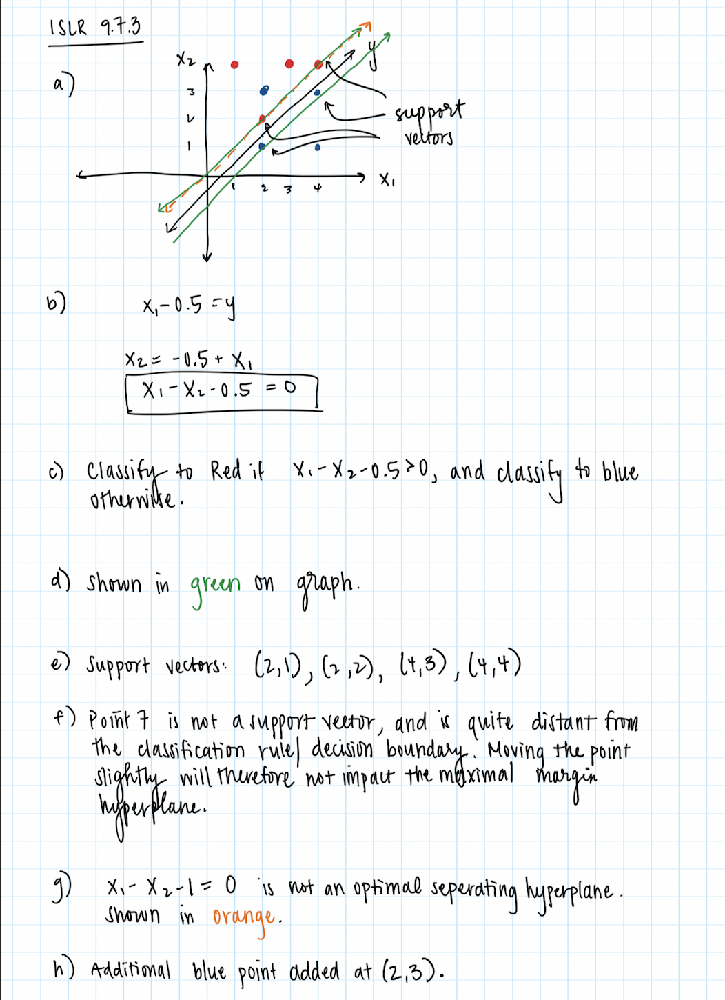